In [1]:
# rdkit mols are displayed as images
from rdkit.Chem.Draw import IPythonConsole

from rdkit.Chem import AllChem as Chem
from rdkit import DataStructs

# descriptors
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors

# diversity picker
from rdkit.SimDivFilters.rdSimDivPickers import MaxMinPicker

# plots
from matplotlib import pyplot
import seaborn

# scikit learn
# conda install -c conda-forge scikit-learn 
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import pair_confusion_matrix

# other packages
import pandas as pd
import csv
import re

In [2]:
# some pChEMBL values in our file are not valid floats
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")
# function for Lipinski's descriptors
lip_func = [("HBA", Lipinski.NumHAcceptors), ("HBD", Lipinski.NumHDonors), ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), ("TPSA", rdMolDescriptors.CalcTPSA), ("RB", Lipinski.NumRotatableBonds)]
# load mtor, we want to remember source of data and pChEMBLE value (it's transfomed compound activity to "standard" value)
with open("VDR_IC50.csv") as inp:
    vdr = [row for row in csv.DictReader(inp, delimiter=";", quotechar='"')]
    for m in vdr:
        m["rdmol"] = Chem.MolFromSmiles(m["Smiles"])
        m["source"] = "vdr"
        m["pChEMBL_value"] = float(m["pChEMBL Value"]) if float_pattern.match(m["pChEMBL Value"]) else 0
        m["fps"] = Chem.GetMorganFingerprintAsBitVect(m["rdmol"],2,nBits=1024)
        for f in lip_func:
            m[f[0]] = f[1](m["rdmol"])

In [3]:
%%capture
# %%capture hides stderr (and maybe all output)
# same for drugbank
drugbank = [{"rdmol": m,
             "source": "drugbank",
             "Smiles": Chem.MolToSmiles(m),
             "pChEMBL_value": 0,
             "fps": Chem.GetMorganFingerprintAsBitVect(m, 2, nBits=1024),
             **{f[0]: f[1](m) for f in lip_func}
            } for m in Chem.SDMolSupplier("cdd2021/data/drugbank.sdf") if m
           ]

In [4]:
df = pd.DataFrame((*drugbank, *vdr), columns=["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)])
# adds index as normal column
df.reset_index(level=0, inplace=True)

In [5]:
df

,index,Smiles,source,rdmol,fps,pChEMBL_value,HBA,HBD,MW,LogP,TPSA,RB
0,0,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28850>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,29,28,2178.985813,-8.11643,901.57,66
1,1,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d288f0>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1268.641439,-3.10570,495.89,31
2,2,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28990>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,15,14,1068.426955,-4.13203,435.41,19
3,3,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28a30>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1429.669818,-0.50613,495.67,38
4,4,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28ad0>,"[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,12,5,1201.841368,3.26900,278.80,15
...,...,...,...,...,...,...,...,...,...,...,...,...
7751,7751,COC(=O)CCc1ccc(OCc2oc(-c3cccc(OC)c3)nc2C)cc1,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d26f80>,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...",5.54,6,0,381.157623,4.34322,70.79,8
7752,7752,COC(=O)Cc1ccc(OCc2oc(-c3cccc(OC)c3)nc2C)cc1,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28080>,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.18,6,0,367.141973,3.95312,70.79,7
7753,7753,C=C1/C(=C\C=C2/CCC[C@]3(C)C(C(C)CCCC(C)(C)O)CC...,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28120>,"[0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",8.95,3,3,416.329045,5.70470,60.69,6
7754,7754,CCN(CC)CCCNC(=O)c1ccc(C(CC)(CC)c2ccc(OCCC(O)(C...,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d281c0>,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, ...",6.53,5,2,541.424343,6.70422,66.73,18


In [6]:
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
            )

In [7]:
df

,index,Smiles,source,rdmol,fps,pChEMBL_value,HBA,HBD,MW,LogP,...,MQN_33,MQN_34,MQN_35,MQN_36,MQN_37,MQN_38,MQN_39,MQN_40,MQN_41,MQN_42
0,0,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28850>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,29,28,2178.985813,-8.11643,...,0,0,3,3,0,0,0,0,0,0
1,1,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d288f0>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1268.641439,-3.10570,...,0,0,4,2,0,0,0,0,2,1
2,2,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28990>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,15,14,1068.426955,-4.13203,...,0,0,1,2,0,0,0,1,0,0
3,3,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28a30>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1429.669818,-0.50613,...,0,0,1,5,0,0,0,0,2,1
4,4,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28ad0>,"[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,12,5,1201.841368,3.26900,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7751,7751,COC(=O)CCc1ccc(OCc2oc(-c3cccc(OC)c3)nc2C)cc1,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d26f80>,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...",5.54,6,0,381.157623,4.34322,...,0,0,1,2,0,0,0,0,0,0
7752,7752,COC(=O)Cc1ccc(OCc2oc(-c3cccc(OC)c3)nc2C)cc1,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28080>,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.18,6,0,367.141973,3.95312,...,0,0,1,2,0,0,0,0,0,0
7753,7753,C=C1/C(=C\C=C2/CCC[C@]3(C)C(C(C)CCCC(C)(C)O)CC...,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28120>,"[0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",8.95,3,3,416.329045,5.70470,...,0,0,1,2,0,0,0,0,2,1
7754,7754,CCN(CC)CCCNC(=O)c1ccc(C(CC)(CC)c2ccc(OCCC(O)(C...,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d281c0>,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, ...",6.53,5,2,541.424343,6.70422,...,0,0,1,1,0,0,0,0,0,0


In [8]:
norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca = decomposition.PCA(n_components=42)
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

In [9]:
df

,index,Smiles,source,rdmol,fps,pChEMBL_value,HBA,HBD,MW,LogP,...,nPCA_33,nPCA_34,nPCA_35,nPCA_36,nPCA_37,nPCA_38,nPCA_39,nPCA_40,nPCA_41,nPCA_42
0,0,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28850>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,29,28,2178.985813,-8.11643,...,-0.000829,0.000068,-0.001520,-0.000044,0.000423,-0.000019,0.000044,-0.000017,1.093130e-06,-2.290378e-06
1,1,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d288f0>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1268.641439,-3.10570,...,-0.000904,-0.000026,-0.001146,-0.000069,-0.000035,-0.000053,0.000086,0.000011,-4.489697e-08,-7.256001e-06
2,2,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28990>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,15,14,1068.426955,-4.13203,...,0.001251,0.007424,-0.004012,-0.005115,0.000477,0.001053,0.000390,-0.002036,-7.673518e-05,-6.451415e-05
3,3,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28a30>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1429.669818,-0.50613,...,-0.000077,0.000230,-0.001104,-0.000087,0.000252,-0.000030,0.000110,-0.000034,1.668193e-06,-3.458951e-06
4,4,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28ad0>,"[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,12,5,1201.841368,3.26900,...,0.000102,0.009139,-0.003442,-0.005332,-0.000787,0.004271,0.000296,-0.005272,-2.442251e-04,-1.330746e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7751,7751,COC(=O)CCc1ccc(OCc2oc(-c3cccc(OC)c3)nc2C)cc1,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d26f80>,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...",5.54,6,0,381.157623,4.34322,...,-0.002657,-0.000216,-0.000161,0.000324,0.000038,-0.000050,-0.000002,-0.000024,-2.269826e-05,8.898375e-07
7752,7752,COC(=O)Cc1ccc(OCc2oc(-c3cccc(OC)c3)nc2C)cc1,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28080>,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.18,6,0,367.141973,3.95312,...,-0.002853,-0.000222,-0.000194,0.000335,0.000098,-0.000055,-0.000009,-0.000024,-2.373439e-05,1.074338e-06
7753,7753,C=C1/C(=C\C=C2/CCC[C@]3(C)C(C(C)CCCC(C)(C)O)CC...,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d28120>,"[0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",8.95,3,3,416.329045,5.70470,...,0.000032,0.000301,-0.000081,0.000285,-0.001479,-0.000153,0.000222,0.000118,1.162215e-05,-1.472858e-06
7754,7754,CCN(CC)CCCNC(=O)c1ccc(C(CC)(CC)c2ccc(OCCC(O)(C...,vdr,<rdkit.Chem.rdchem.Mol object at 0x7fb898d281c0>,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, ...",6.53,5,2,541.424343,6.70422,...,-0.001289,0.000166,0.000231,-0.000028,-0.002399,0.000031,0.000111,0.000062,5.522381e-06,3.309653e-06


In [10]:
sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

In [11]:
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

In [12]:
dist_mat

array([[0.        , 0.62893082, 0.59285714, ..., 0.91836735, 0.85106383,
        0.875     ],
       [0.62893082, 0.        , 0.69375   , ..., 0.875     , 0.89171975,
        0.85416667],
       [0.59285714, 0.69375   , 0.        , ..., 0.90510949, 0.89130435,
        0.875     ],
       ...,
       [0.91836735, 0.875     , 0.90510949, ..., 0.        , 0.9047619 ,
        0.92929293],
       [0.85106383, 0.89171975, 0.89130435, ..., 0.9047619 , 0.        ,
        0.85263158],
       [0.875     , 0.85416667, 0.875     , ..., 0.92929293, 0.85263158,
        0.        ]])

In [13]:
len(dist_mat)

7756

In [14]:
df['mds_x']

0       0.366681
1      -0.319754
2       0.507468
3       0.343107
4      -0.206915
          ...   
7751   -0.063462
7752    0.221254
7753    0.594877
7754   -0.322492
7755   -0.002176
Name: mds_x, Length: 7756, dtype: float64

In [15]:
df[['source','mds_y']]

,source,mds_y
0,drugbank,0.145885
1,drugbank,-0.446008
2,drugbank,-0.029134
3,drugbank,0.313275
4,drugbank,0.672544
...,...,...
7751,vdr,-0.103774
7752,vdr,-0.086064
7753,vdr,-0.335295
7754,vdr,-0.418883


In [16]:
clf = manifold.TSNE(n_components=2, metric="precomputed")
X_tsne = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))

/home/valeriia/anaconda3/envs/pnl/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:691: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  warnings.warn(


# Hierarchical clustering

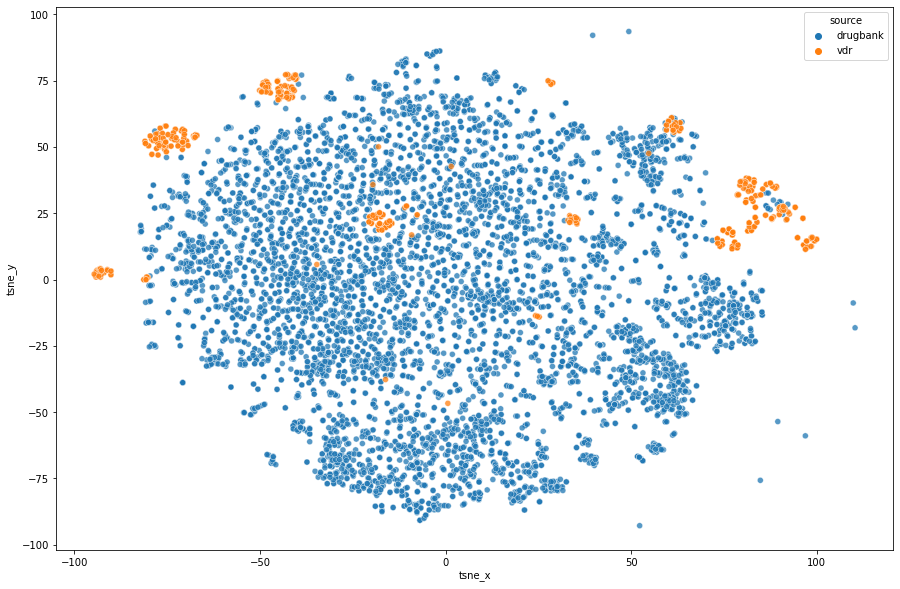

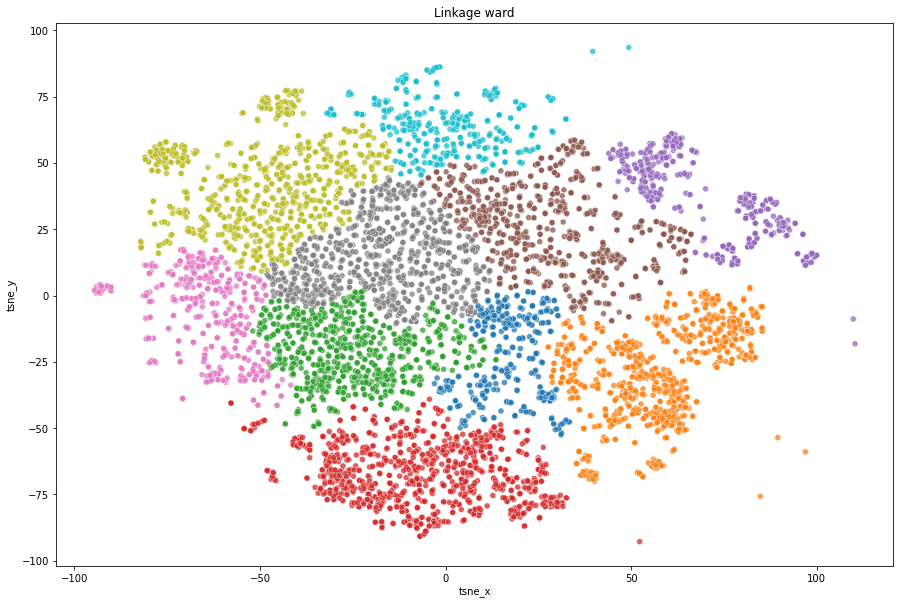

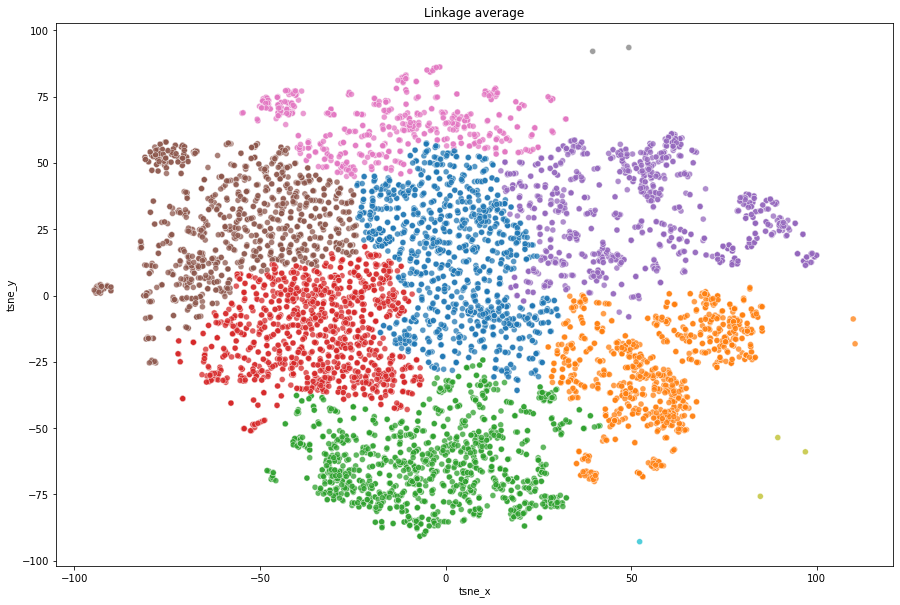

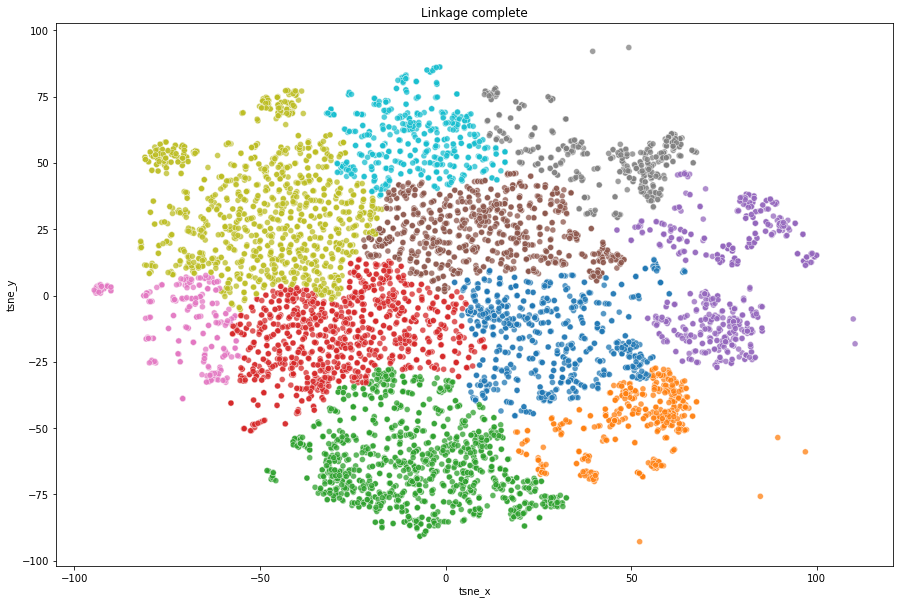

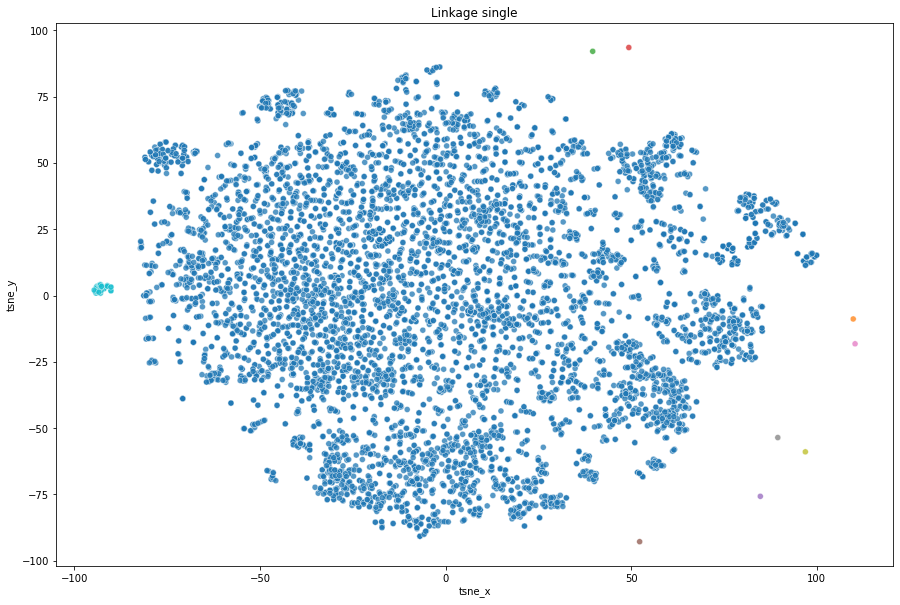

In [17]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[["tsne_x", "tsne_y"]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")


Rozdeleni pomoci ward, avarage, complete je dobra a je to krasne videt
jak je to rozdeleny
Ale single moct nefunguje

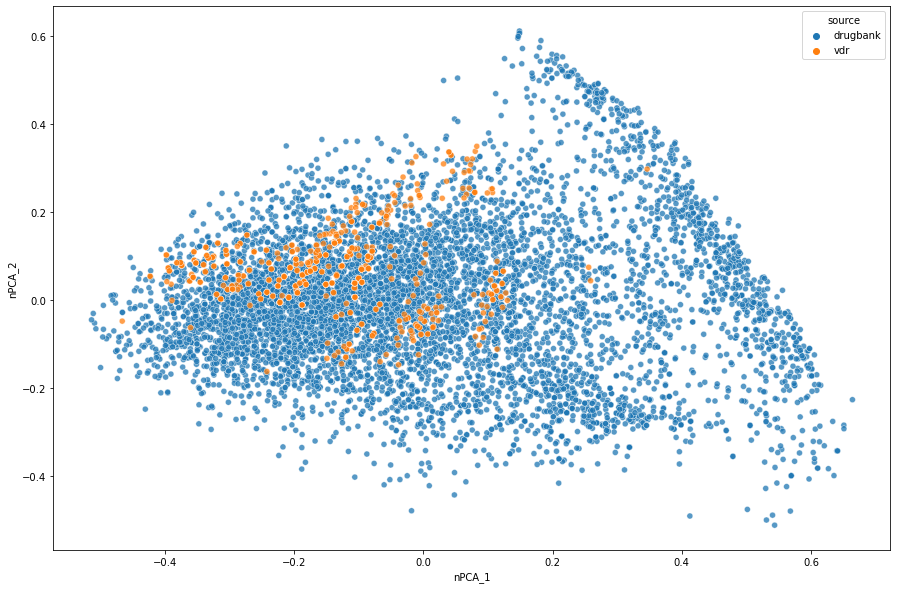

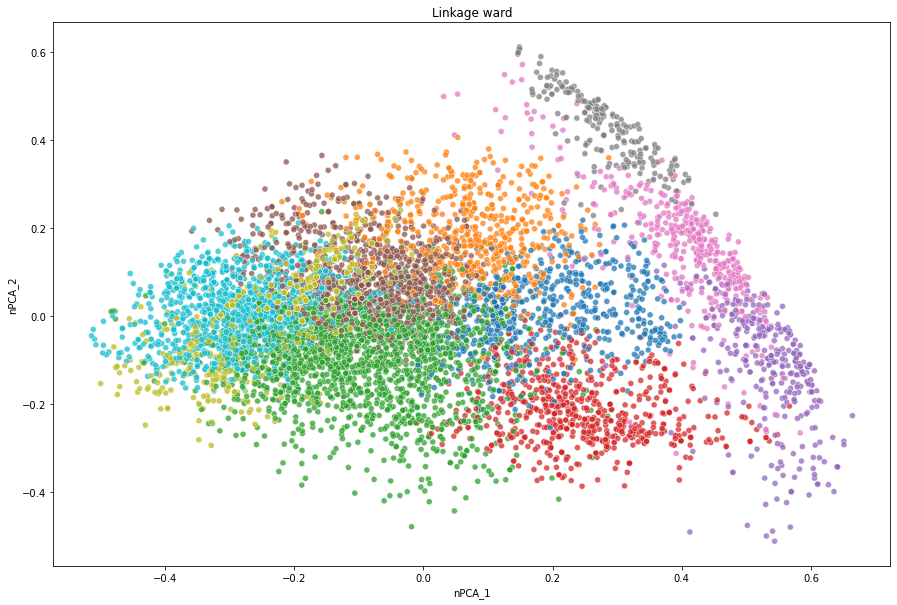

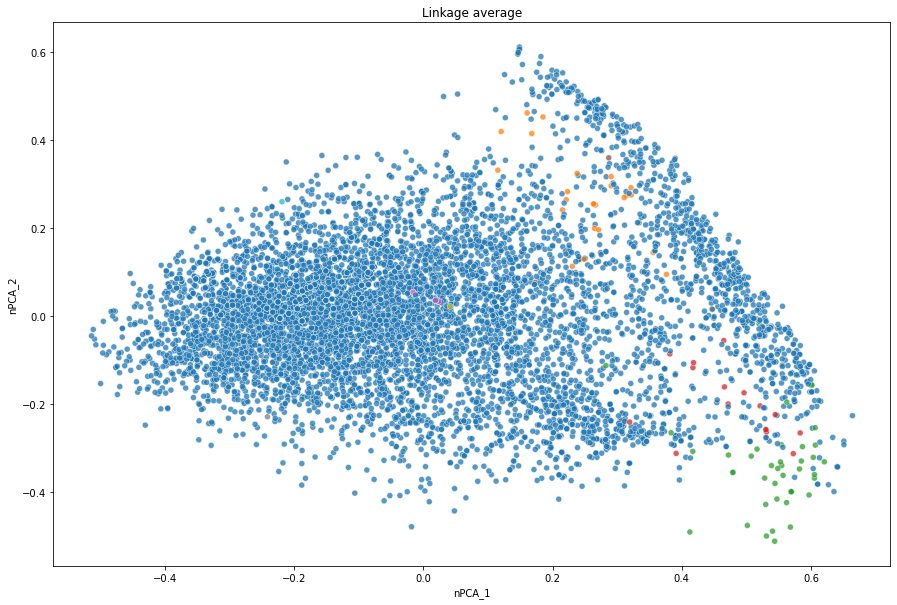

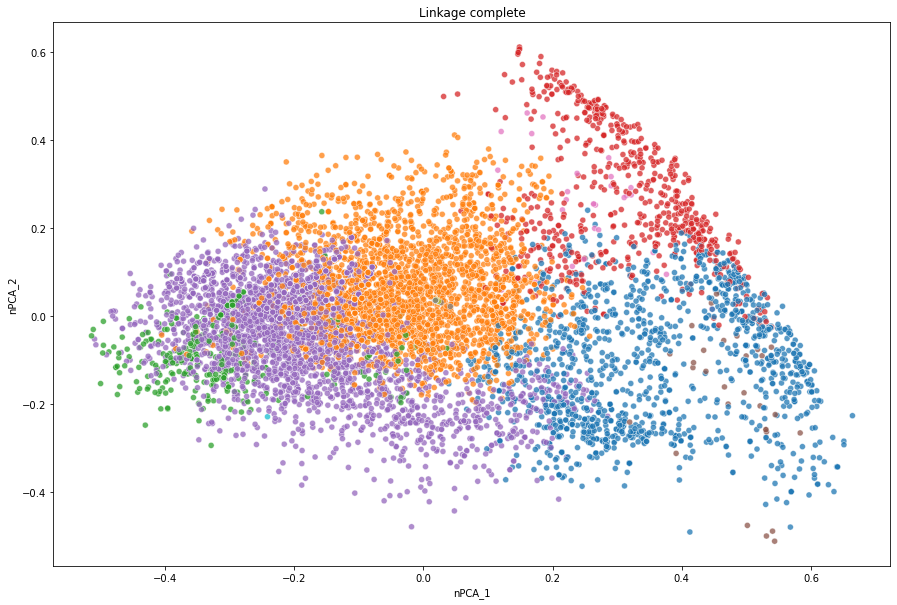

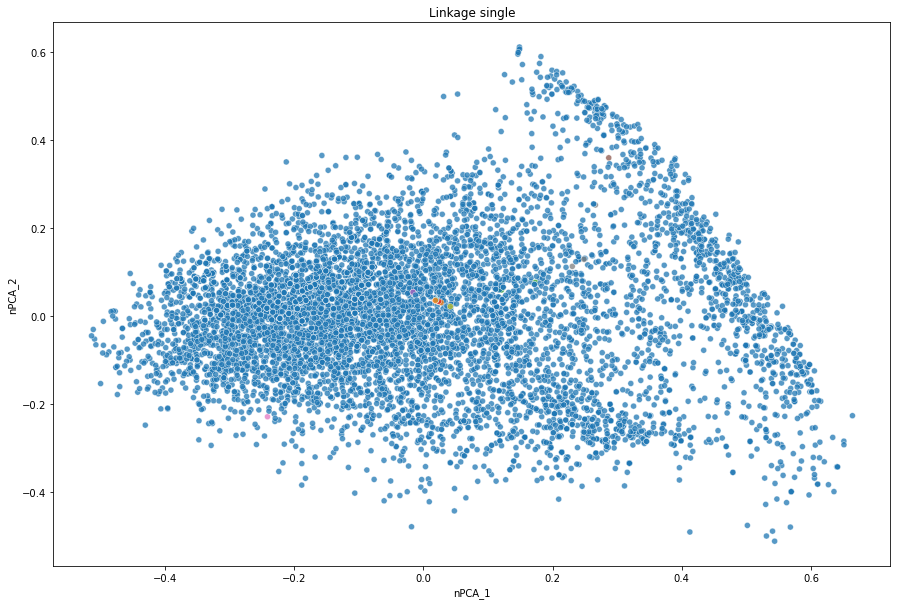

In [18]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[[f"nPCA_{x}" for x in range(1, 43)]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")


# K-means clustering algorithm

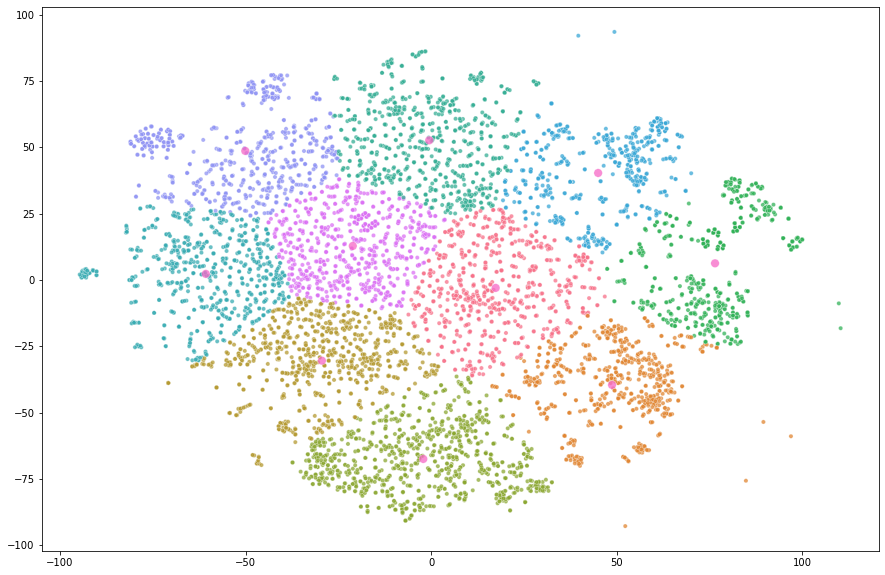

In [19]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["tsne_x"], *centroids[:, 0]],
                  y=[*df["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



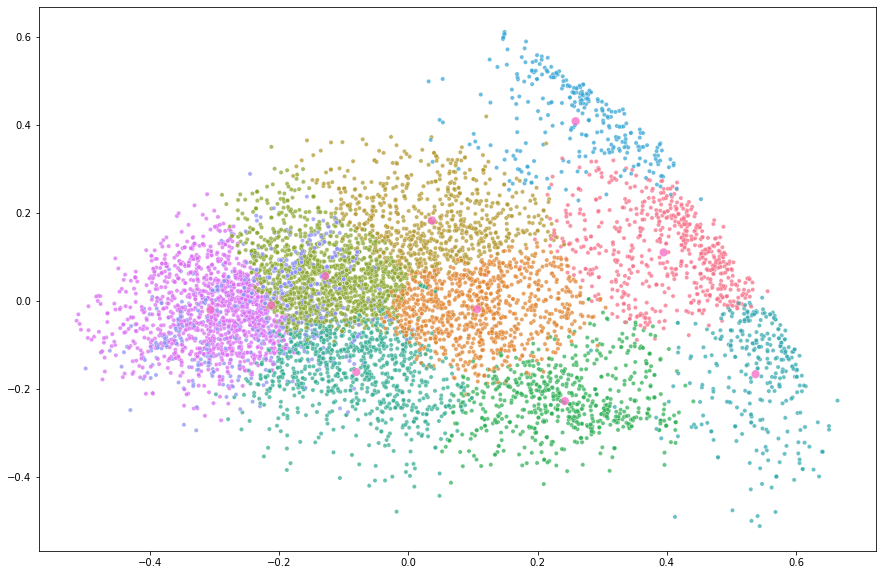

In [24]:
reduced_data = df[[f"nPCA_{x}" for x in range(1, 43)]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_

# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["nPCA_1"], *centroids[:, 0]],
                  y=[*df["nPCA_2"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+3)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )

K-means docela dobre rozdelil data do 10 clustru

## n_clusters = 10

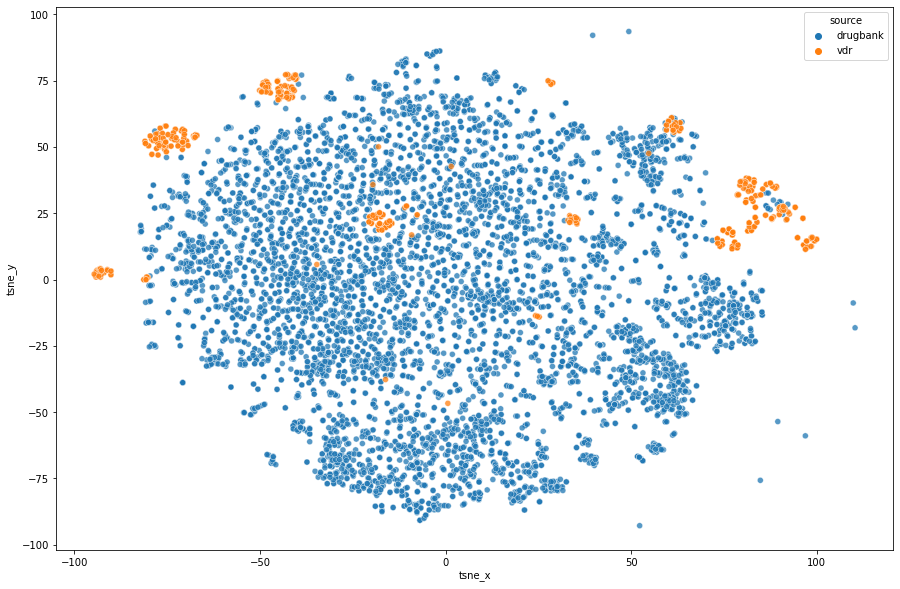

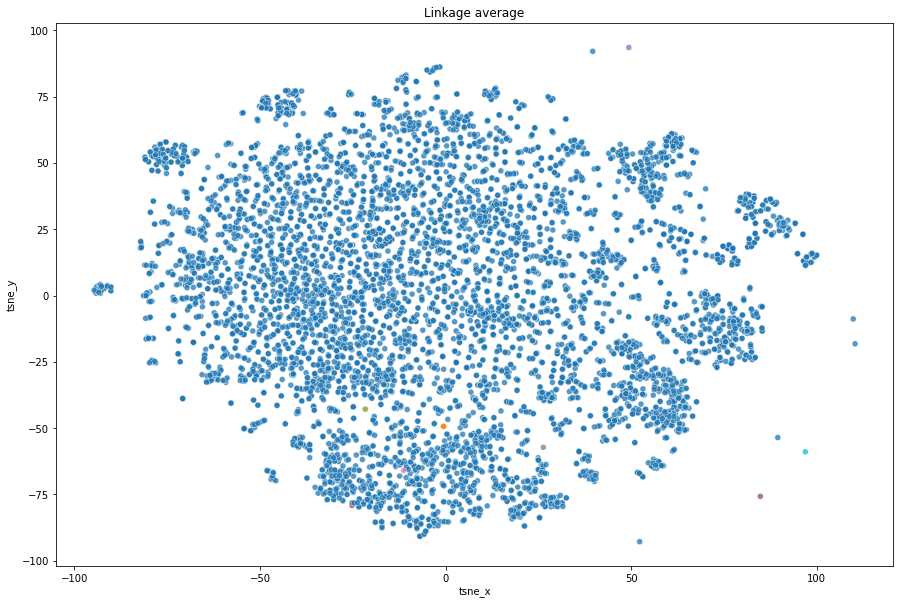

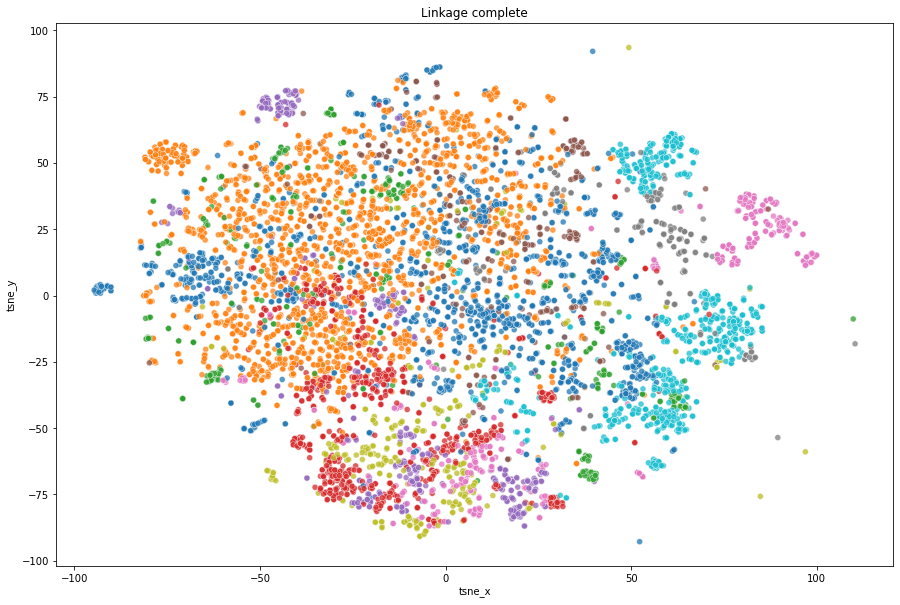

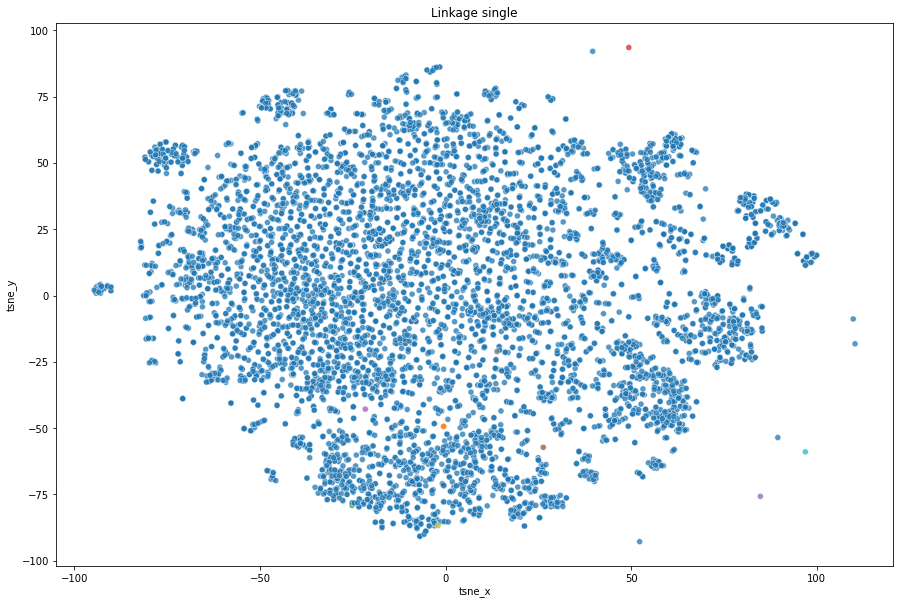

In [20]:
n_clusters = 10
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

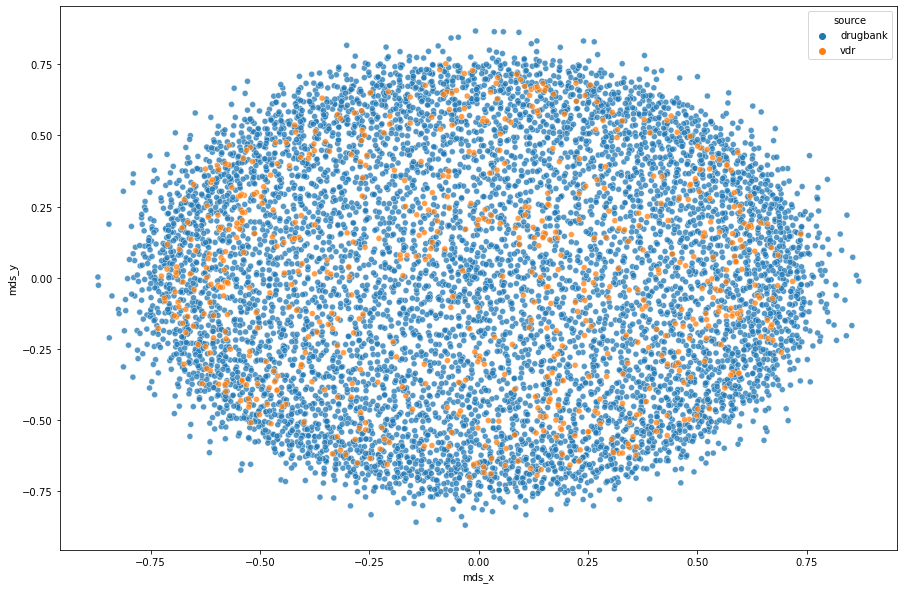

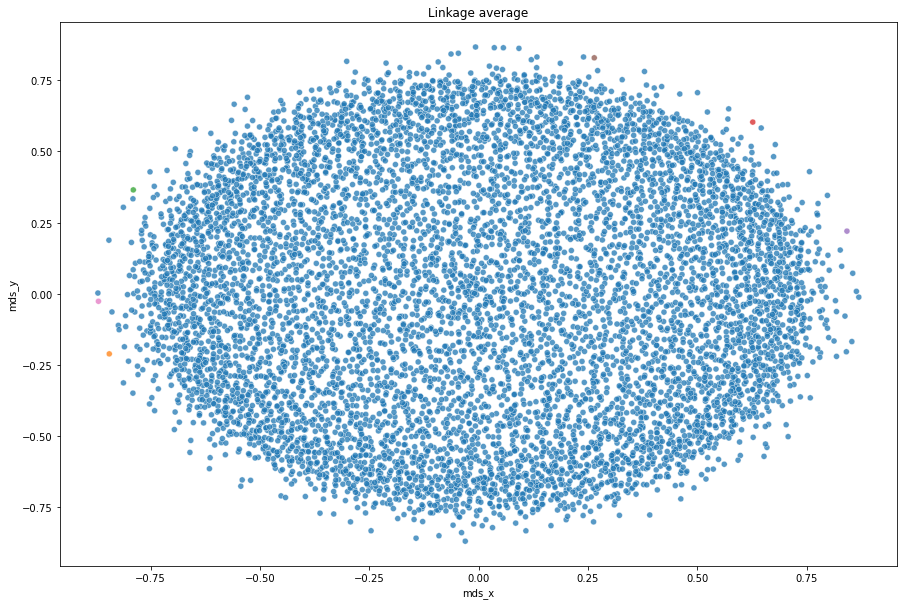

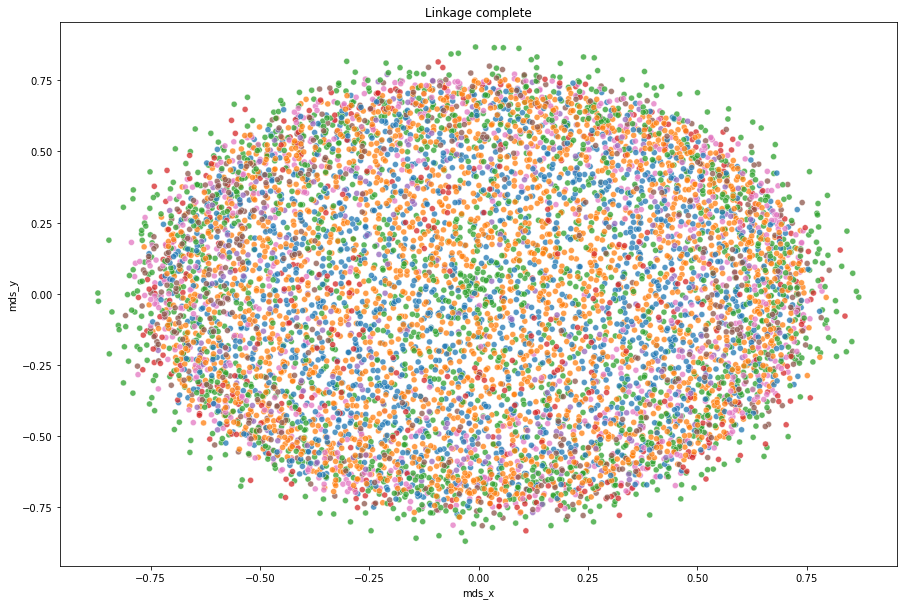

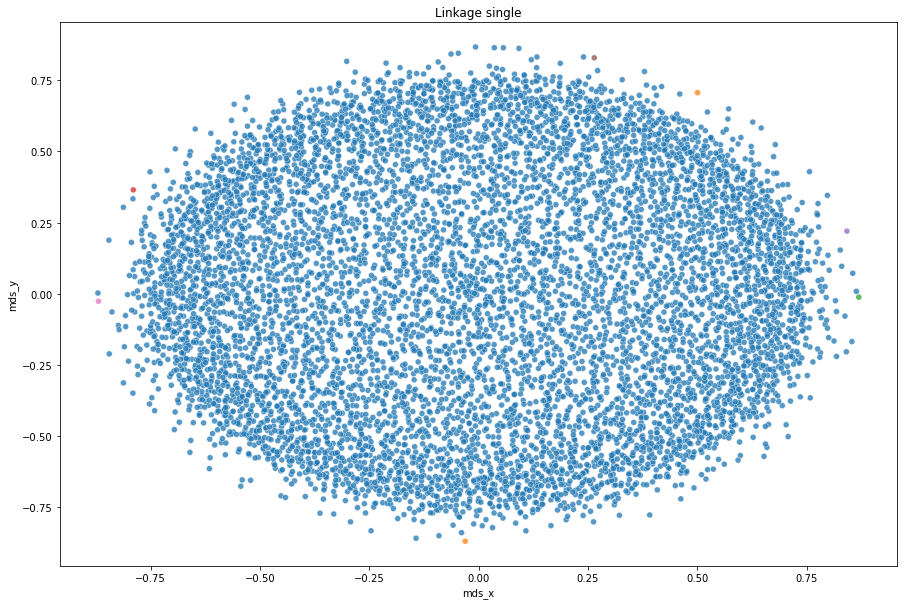

In [23]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

Uplne to selhalo, takze zkusime zmenit pocet clusteru

## n_cluster = 7

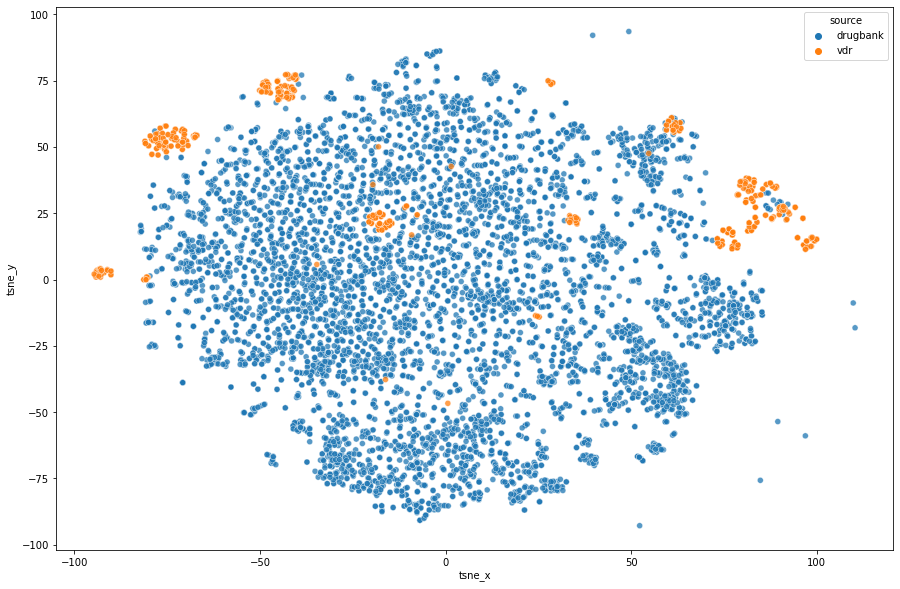

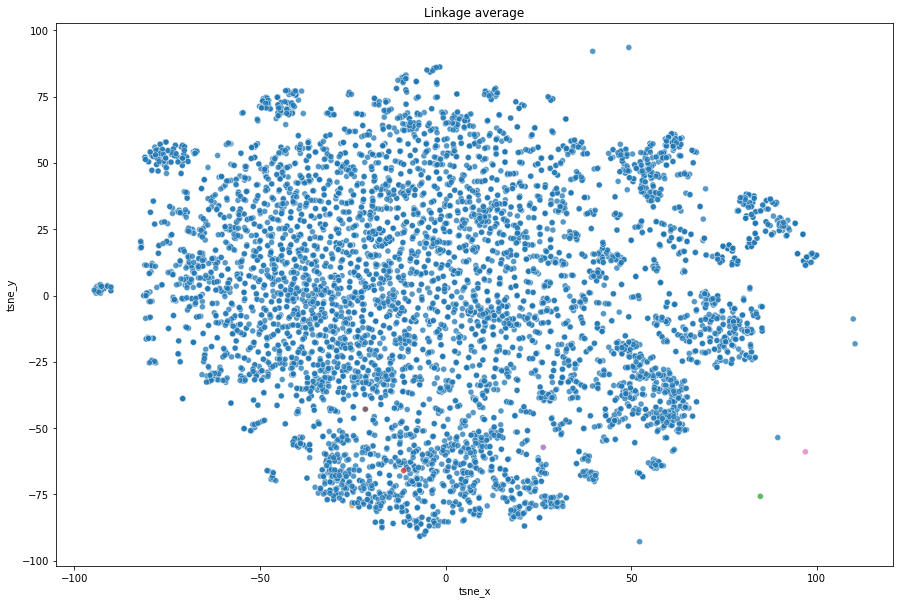

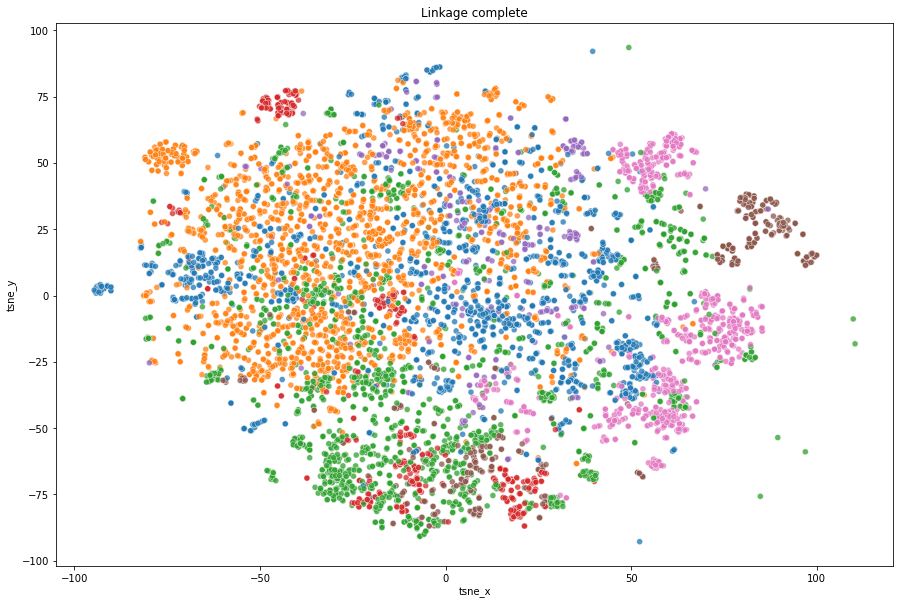

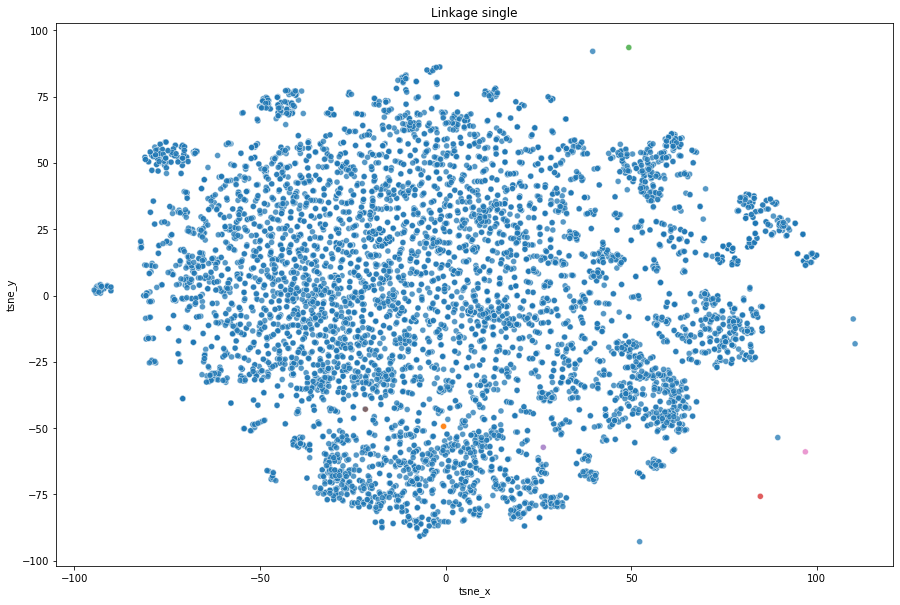

In [21]:
n_clusters = 7
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

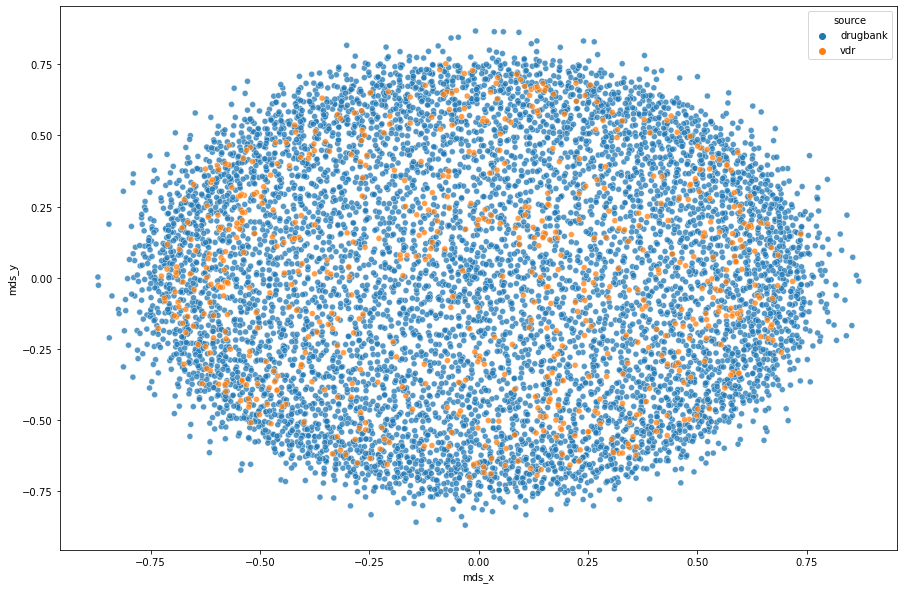

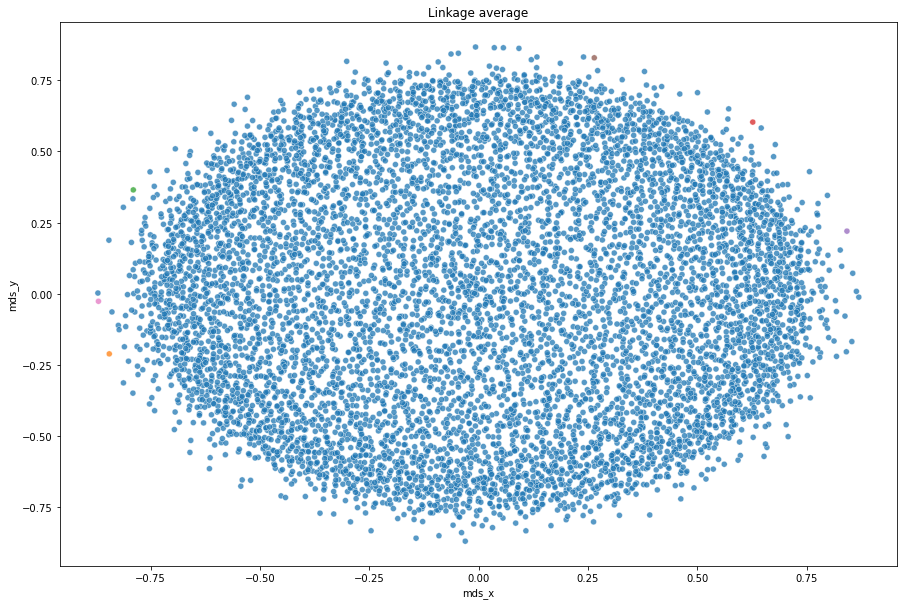

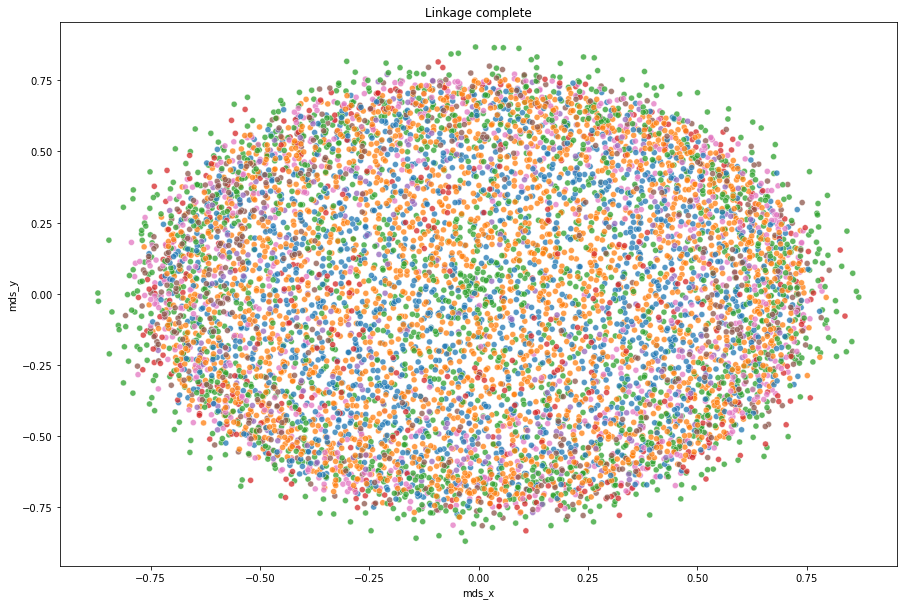

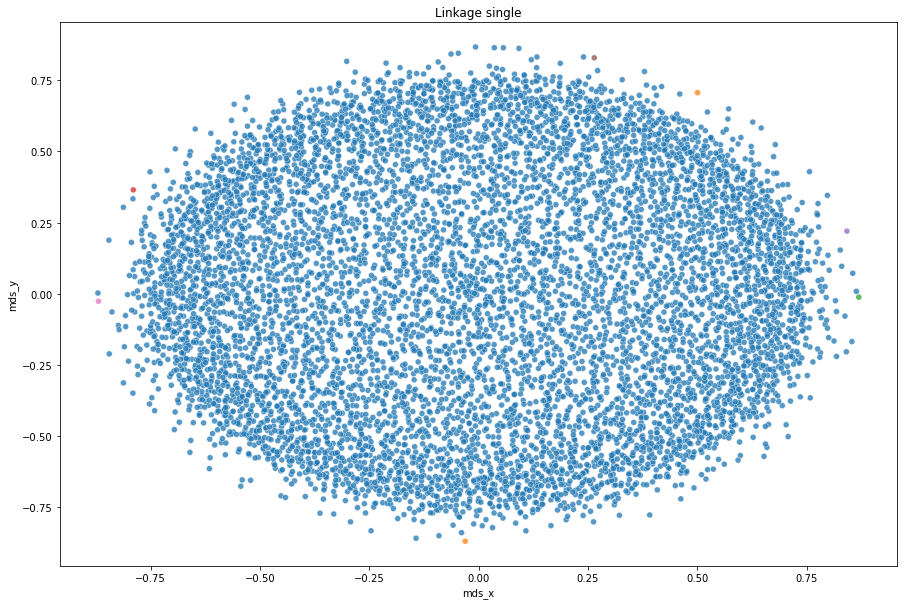

In [22]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

Jsem zkousela ruzny pocet clustru ale ani jednou to nefungovalo dobre
Je videt ze tsne funguje o hodne lip nez mds. Ale zmena poctu clusteru 
vubec nenapravila situaci


Tak na mem data setu metody clutrovani protoze mam nevzbalancovany data set, ligandu y VDR receptoru je kolem 600 
a ligandu y Drugbank je nejakych 7000

# Confusion matrix

In [25]:
data = df[['source','tsne_x','tsne_y']]
data

,source,tsne_x,tsne_y
0,drugbank,18.099823,-9.116450
1,drugbank,16.586905,-10.545765
2,drugbank,21.063812,-8.108732
3,drugbank,16.215420,-12.202934
4,drugbank,26.336939,-1.105220
...,...,...,...
7751,vdr,-16.879728,24.483885
7752,vdr,-17.779226,25.233662
7753,vdr,90.983955,27.591999
7754,vdr,-92.673950,3.502428


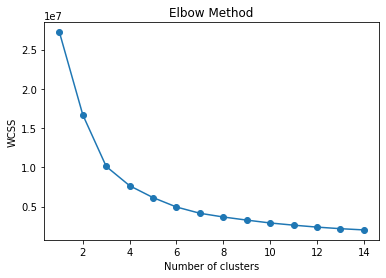

In [26]:
wcss = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(df[["tsne_x", "tsne_y"]])
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 15), wcss, 'o-')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Nejlepsi pocet clusteru je 4

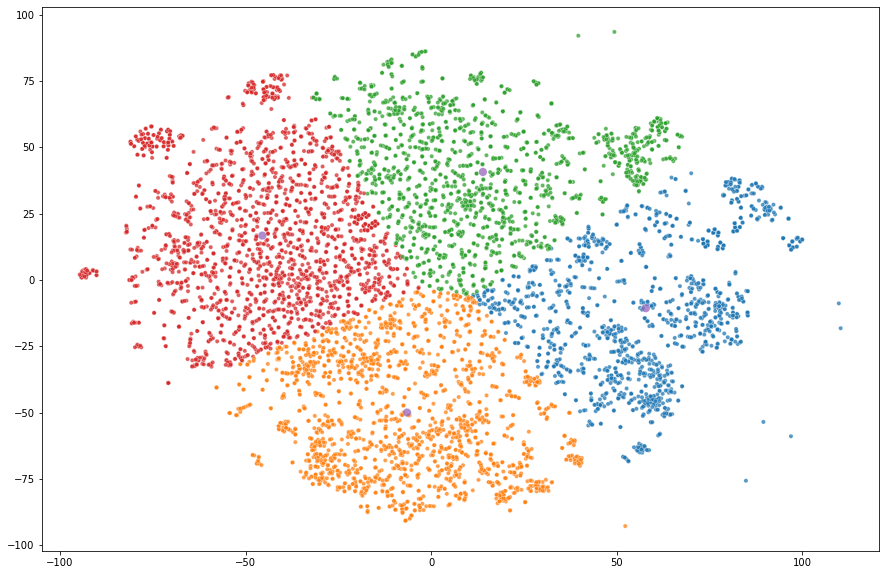

In [86]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 4
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*reduced_data["tsne_x"], *centroids[:, 0]],
                  y=[*reduced_data["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



In [87]:
kmeans.labels_

array([1, 1, 1, ..., 1, 3, 3], dtype=int32)

In [88]:
data['cluster'] = kmeans.labels_
data

<ipython-input-88-47d026fa4580>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = kmeans.labels_


,source,tsne_x,tsne_y,cluster
0,drugbank,18.099823,-9.116450,1
1,drugbank,16.586905,-10.545765,1
2,drugbank,21.063812,-8.108732,1
3,drugbank,16.215420,-12.202934,1
4,drugbank,26.336939,-1.105220,1
...,...,...,...,...
7751,vdr,-16.879728,24.483885,3
7752,vdr,-17.779226,25.233662,3
7753,vdr,90.983955,27.591999,1
7754,vdr,-92.673950,3.502428,3


In [89]:


for x in range(4):
    print("Cluster:",x)
    a = data[data['cluster']==x].set_index(['tsne_x', 'tsne_y',"source"]).count(level="source")
    print(a)
    print('\n')

Cluster: 0
          cluster
source           
drugbank     2025
vdr             2


Cluster: 1
          cluster
source           
drugbank     1395
vdr           256


Cluster: 2
          cluster
source           
drugbank     1704
vdr            78


Cluster: 3
          cluster
source           
drugbank     1989
vdr           307




Muzeme videt ze napriklad cluster cislo 2 docela dobre funguje a udelal cluster skoro jenom z hodnot drugbank, jenom
tam omylem zapadli 2 ligandy z VDR
Muzeme taky soudit ze napriklad cluster 3 ma taky cluster z drugbank hodnotami, a omzlem tam zabadli 78 hodnot z VDR
Ale celkove to moct nefunguje, protoze nedostali jsme ani jeden cluster z VDR ligandami
Muzeme zkusit navysit pocet clustru a se podivat jaky to bude mit vliv

# n_clusters = 10

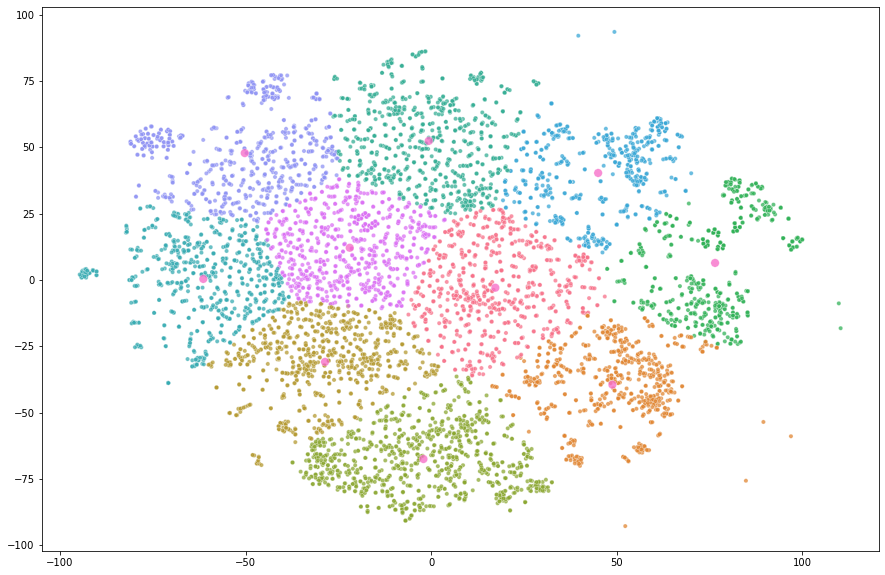

In [50]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeanss = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeanss.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*reduced_data["tsne_x"], *centroids[:, 0]],
                  y=[*reduced_data["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



In [51]:
data['cluster'] = kmeanss.labels_

<ipython-input-51-fc2acfa9f580>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = kmeanss.labels_


In [56]:
for x in range(10):
    print("Cluster:",x)
    a = data[data['cluster']==x].set_index(['tsne_x', 'tsne_y',"source"]).count(level="source")
    print(a)
    print('\n')

Cluster: 0
          cluster
source           
drugbank      540
vdr            69


Cluster: 1
          cluster
source           
drugbank     1035
vdr             2


Cluster: 2
          cluster
source           
drugbank      593
vdr           205


Cluster: 3
          cluster
source           
drugbank      904
vdr            69


Cluster: 4
          cluster
source           
drugbank      729


Cluster: 5
          cluster
source           
drugbank      659
vdr             1


Cluster: 6
          cluster
source           
drugbank      660


Cluster: 7
          cluster
source           
drugbank      760
vdr            40


Cluster: 8
          cluster
source           
drugbank      382
vdr           247


Cluster: 9
          cluster
source           
drugbank      851
vdr            10




Tady muzeme videt ze cluster 1,4,5,6 docela dobre shulkoval nasi data, jsou tam ligandy jenom z Drugbank,
ale skoro nejsou tam hodnoty z VDR receptoru
Ale stejne jsme nedostali zadny shulek ktery by obsahoval vetsinu hodnot z VDR receptoru, a kdyz se podivate na
clusrt = 8 tak je tam videt ze to tam hrozne moc zamichano
Jako zaver bych chtela rict ze na mem data setu nejde udelat dobry shulkovou analyzu a jediny problem proc je to tim 
ze v data setu neni prumerne zastoupeni ligandu stejne v jednotlivych tridach
Tak zkusime vzit z drugbanku jenom 1000 ligandu a zkusit provest jeste na takovem data setu analyzu

In [65]:
vdr = data[7113:]

In [67]:
drugbank = data[:1000]

In [70]:
data_new = drugbank.append(vdr, ignore_index = True)
data_new

,source,tsne_x,tsne_y,cluster
0,drugbank,18.099823,-9.116450,9
1,drugbank,16.586905,-10.545765,9
2,drugbank,21.063812,-8.108732,9
3,drugbank,16.215420,-12.202934,9
4,drugbank,26.336939,-1.105220,9
...,...,...,...,...
1638,vdr,-16.879728,24.483885,3
1639,vdr,-17.779226,25.233662,3
1640,vdr,90.983955,27.591999,8
1641,vdr,-92.673950,3.502428,7


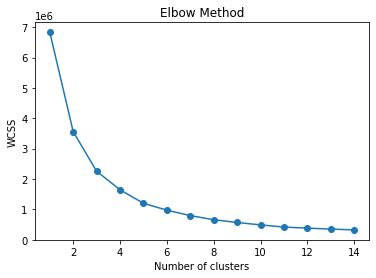

In [71]:
wcss = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(data_new[["tsne_x", "tsne_y"]])
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 15), wcss, 'o-')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Nejlepsi pocet clustru je 4

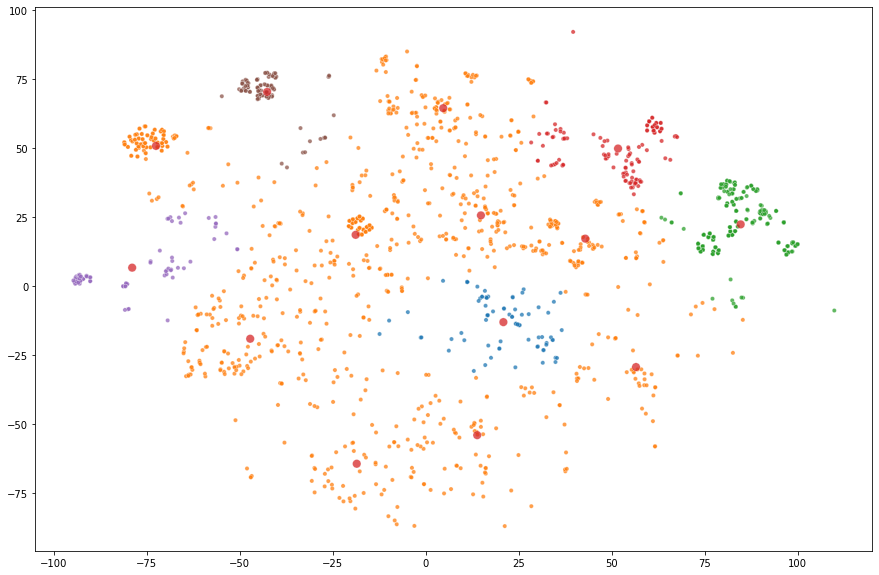

In [72]:
reduced_data = data_new[["tsne_x", "tsne_y"]]
n_clusters = 4
kmeans_new = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans_new.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*reduced_data["tsne_x"], *centroids[:, 0]],
                  y=[*reduced_data["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



In [73]:
data_new['cluster'] = kmeans_new.labels_

In [76]:
for x in range(4):
    print("Cluster:",x)
    a = data_new[data_new['cluster']==x].set_index(['tsne_x', 'tsne_y',"source"]).count(level="source")
    print(a)
    print('\n')

Cluster: 0
          cluster
source           
drugbank      119
vdr           246


Cluster: 1
          cluster
source           
drugbank      198
vdr           279


Cluster: 2
          cluster
source           
drugbank      343
vdr           107


Cluster: 3
          cluster
source           
drugbank      340
vdr            11




Tak ted je to uplne zamichany, jen cluster cislo 4 je urcite cluster ligandu Drugbank a omylem tam vyskytuji 11 vdr ligandu
Tak zkusime jeste yvetsit pocet clusteru treba na 10

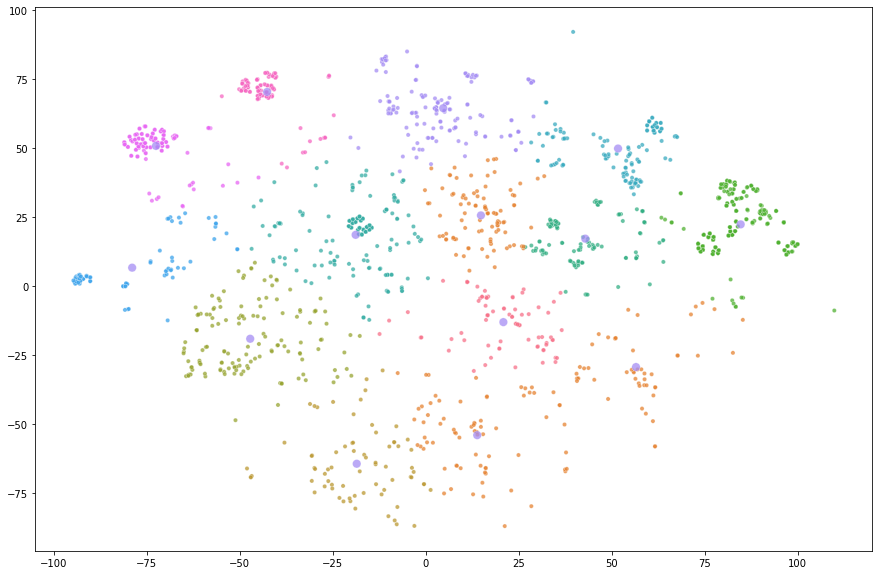

In [78]:
reduced_data = data_new[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeans_new = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans_new.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*reduced_data["tsne_x"], *centroids[:, 0]],
                  y=[*reduced_data["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



In [79]:
data_new['cluster'] = kmeans_new.labels_

In [80]:
for x in range(10):
    print("Cluster:",x)
    a = data_new[data_new['cluster']==x].set_index(['tsne_x', 'tsne_y',"source"]).count(level="source")
    print(a)
    print('\n')

Cluster: 0
          cluster
source           
drugbank       40
vdr           247


Cluster: 1
          cluster
source           
drugbank       26
vdr           205


Cluster: 2
          cluster
source           
drugbank      142


Cluster: 3
          cluster
source           
drugbank      107
vdr            69


Cluster: 4
          cluster
source           
drugbank      154
vdr            27


Cluster: 5
          cluster
source           
drugbank      122
vdr             2


Cluster: 6
          cluster
source           
drugbank      145
vdr            12


Cluster: 7
          cluster
source           
drugbank      113
vdr             9


Cluster: 8
          cluster
source           
drugbank      109
vdr            32


Cluster: 9
          cluster
source           
drugbank       42
vdr            40




Konecne mame nekdy predikoveny cluster pro VDR ligandy v nasim pripade je to cluster 0 a omylem tam vyskytuji 40 jinych ligandu
ale taky jsme dostali cluster cislo 2 kde jsou jenom ligandy z drugbank
Tak posledni pokus, zkusime pocet clustru 16

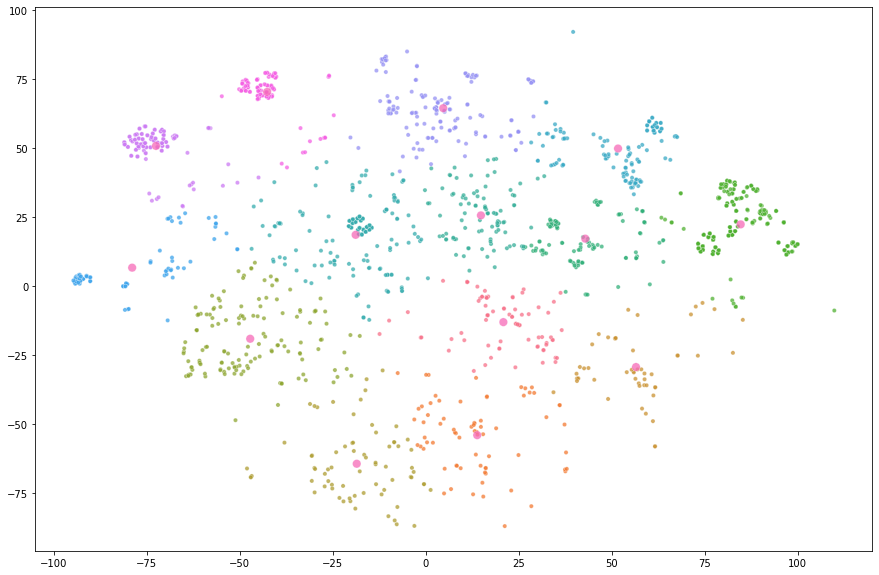

In [82]:
reduced_data = data_new[["tsne_x", "tsne_y"]]
n_clusters = 16
kmeans_new = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans_new.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*reduced_data["tsne_x"], *centroids[:, 0]],
                  y=[*reduced_data["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



In [84]:
data_new['cluster'] = kmeans_new.labels_

In [85]:
for x in range(16):
    print("Cluster:",x)
    a = data_new[data_new['cluster']==x].set_index(['tsne_x', 'tsne_y',"source"]).count(level="source")
    print(a)
    print('\n')

Cluster: 0
          cluster
source           
drugbank       54
vdr            69


Cluster: 1
          cluster
source           
drugbank       13
vdr            45


Cluster: 2
          cluster
source           
drugbank       62
vdr             1


Cluster: 3
          cluster
source           
drugbank       19
vdr           110


Cluster: 4
          cluster
source           
drugbank       77
vdr             9


Cluster: 5
          cluster
source           
drugbank       88
vdr            32


Cluster: 6
          cluster
source           
drugbank      106


Cluster: 7
          cluster
source           
drugbank       94
vdr             1


Cluster: 8
          cluster
source           
drugbank       89
vdr            27


Cluster: 9
          cluster
source           
drugbank       14
vdr            95


Cluster: 10
          cluster
source           
drugbank       86
vdr             1


Cluster: 11
          cluster
source           
drugbank       68
vdr             

Tak napriklad cluster 15 ma 202 vdr ligandy a jenom 17 drugbank, myslim si ze lepsi vysledek uz nebude :0